In [1]:
import os
import time
import numpy as np
import pandas as pd
import pickle as pkl
import matplotlib.pyplot as plt

import seaborn as sns
sns.set_context('notebook', font_scale=1.5, rc={'lines.markeredgewidth': 2})

In [2]:
from sklearn.cluster import SpectralClustering

In [3]:
import visual_behavior_glm.GLM_analysis_tools as gat

In [4]:
import visual_behavior.visualization.utils as utils
import visual_behavior.data_access.loading as loading
import visual_behavior.data_access.utilities as utilities

from visual_behavior.dimensionality_reduction import clustering as vba_clust

In [5]:
%load_ext autoreload
%autoreload 2
%matplotlib inline


### get experiments and cells tables and limit to closest familiar and novel active

In [6]:
experiments_table = loading.get_platform_paper_experiment_table()
len(experiments_table)

1249

In [7]:
# limit to closest familiar and novel active
experiments_table = utilities.limit_to_last_familiar_second_novel_active(experiments_table)
experiments_table = utilities.limit_to_containers_with_all_experience_levels(experiments_table)
len(experiments_table)

402

In [8]:
matched_experiments = experiments_table.index.values

In [9]:
cells_table = loading.get_cell_table()
len(cells_table.cell_specimen_id.unique())

28833

In [10]:
# limit to cells matched in closest familiar and novel active
cells_table = utilities.limit_to_last_familiar_second_novel_active(cells_table)
cells_table = utilities.limit_to_containers_with_all_experience_levels(cells_table)
cells_table = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(cells_table)
len(cells_table.cell_specimen_id.unique())

3921

In [11]:
matched_cells = cells_table.cell_specimen_id.unique()

In [12]:
cre_lines = np.sort(cells_table.cre_line.unique())

cell_types={}
for cre_line in cre_lines:
    cell_types[cre_line] = experiments_table[experiments_table.cre_line==cre_line].cell_type.unique()[0]

### get GLM output, filter and reshape

In [13]:
glm_version = '24_events_all_L2_optimize_by_session'
model_output_type = 'adj_fraction_change_from_full'

In [14]:
base_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_plots\figure_4'
base_dir = os.path.join(base_dir, glm_version)
if not os.path.exists(base_dir):
    os.mkdir(base_dir)
    
folder = '220226_across_session_norm_varying_k'
save_dir = os.path.join(base_dir, folder)
if not os.path.exists(save_dir):
    os.mkdir(save_dir)

In [15]:
# results_pivoted = gat.build_pivoted_results_summary(value_to_use=model_output_type, results_summary=None,
#                                              glm_version=glm_version, cutoff=None)

# full_results_pivoted = results_pivoted.copy()

# # get rid of passive sessions
# results_pivoted = results_pivoted[results_pivoted.passive==False]

### get across session normalized dropouts

In [16]:
import visual_behavior_glm.GLM_across_session as gas

In [17]:
df = gas.load_cells(cells='all')

1086494804 could not be loaded
1086494677 could not be loaded
1086494537 could not be loaded
1086494288 could not be loaded
1086494248 could not be loaded
1086494176 could not be loaded
1086494076 could not be loaded
1086493993 could not be loaded
1086493543 could not be loaded
1086493441 could not be loaded
1086493384 could not be loaded
1086493213 could not be loaded
1086493082 could not be loaded
1086492984 could not be loaded
1086492915 could not be loaded


In [18]:
df = df.set_index('identifier')
df = df.rename(columns={'ophys_experiment_id_x':'ophys_experiment_id', 'cell_specimen_id_x':'cell_specimen_id'})

In [19]:
within = df[[key for key in df.keys() if '_within' in key]+['ophys_experiment_id', 'cell_specimen_id', 'experience_level']]
across = df[[key for key in df.keys() if '_across' in key]+['ophys_experiment_id', 'cell_specimen_id', 'experience_level']]

In [20]:
results_pivoted = across.copy()
results_pivoted = results_pivoted.rename(columns={'omissions_across':'omissions', 'all-images_across':'all-images', 
                                         'behavioral_across':'behavioral', 'task_across':'task'})

In [21]:
# limit to last familiar and second novel 
results_pivoted = results_pivoted[results_pivoted.ophys_experiment_id.isin(matched_experiments)]
results_pivoted = results_pivoted[results_pivoted.cell_specimen_id.isin(matched_cells)]
print(len(results_pivoted.cell_specimen_id.unique()))

results_pivoted.to_hdf(os.path.join(save_dir, glm_version+'_results_pivoted.h5'), key='df')

3906


In [23]:
level_up_features = ['all-images', 'omissions', 'behavioral', 'task']
columns = [*level_up_features, 'cell_specimen_id', 'experience_level']
features = level_up_features 

# results_pivoted = results_pivoted.sort_values('date_of_acquisition').reset_index(drop=True)
rspm = results_pivoted[columns]

# make everything positive
for feature in features: 
    rspm[feature] = np.abs(rspm[feature]) 
    
df = vba_clust.pivot_df(rspm, dropna=True)
print(len(df))

df.to_hdf(os.path.join(save_dir, glm_version+'_df.h5'), key='df')

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



No duplicated cells found
3906


In [24]:
# get metadata for cells in matched cells df
df_meta = cells_table[cells_table.cell_specimen_id.isin(df.index.values)]
df_meta = df_meta.drop_duplicates(subset='cell_specimen_id')
df_meta = df_meta.set_index('cell_specimen_id')
len(df_meta)

3906

In [25]:
cre_lines = np.sort(df_meta['cre_line'].unique())
cre_line_dfs = {}
for cre_line in cre_lines:
    cids = df_meta[df_meta['cre_line']==cre_line].index.values
    df_cre = df.loc[cids].copy()
    cre_line_dfs[cre_line] = df_cre

### cluster for different K and save within cluster correlations

In [26]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [27]:
def get_cluster_density_df(df_dropouts, labels_df, label_col='cluster_id', use_spearmanr=False):
    '''
    Computes correlation coefficients for clusters computed on glm dropouts
    df_dropouts: dataframe where rows are unique cell_specimen_ids and columns are dropout scores across experience levels
    labels_df: dataframe with cell_specimen_ids as index and a cluster label as a column
    labels_col: column name for cluster labels to use (ex: 'labels', 'cluster_id')
    '''
    labels = labels_df[label_col].unique()
    cluster_corrs_list = []
    for label in labels:
        cluster_csids = labels_df[labels_df[label_col]==label].index.values
        cluster_dropouts = df_dropouts.loc[cluster_csids]
        csids = cluster_dropouts.index.values
        cluster_means = cluster_dropouts.mean().abs().values
        within_cluster = cluster_dropouts.abs()
        corr_coeffs = []
        for cid in csids:
            if use_spearmanr is False:
                corr_coeff = np.corrcoef(cluster_means, within_cluster.loc[cid].values)[0][1]
            elif use_spearmanr is True:
                corr_coeff = spearmanr(cluster_means, within_cluster.loc[cid].values)[0]
            cluster_corrs_list.append([cid, label, corr_coeff])
    columns = ['cell_specimen_id', label_col,  'correlation_coefficient']
    cluster_corrs = pd.DataFrame(cluster_corrs_list, columns=columns)
    return cluster_corrs

### set K values

In [30]:
K_values = [3,4,5,6,7,8,9,10,11,12,13,14]

### get cluster labels & corr coeffs for all Ks

In [43]:
corr_df = pd.DataFrame() 
for n_clusters in K_values:
    coclust_filename = glm_version+'_coClustering_matrix_K_'+str(n_clusters)+'.pkl'
    coclust_path = os.path.join(save_dir, coclust_filename)
    if os.path.exists(coclust_path):
        with open(coclust_path, 'rb') as f:
            coclustering_matrices  = pkl.load(f)
            f.close()
        generate_matrices = False
    else:
        generate_matrices = True
        coclustering_matrices = {}
    for i, cre_line in enumerate(cre_lines):
        # co-clustering
        sc = SpectralClustering()
        X = cre_line_dfs[cre_line].values
        if generate_matrices:
            m = vba_clust.get_coClust_matrix(X=X, n_clusters=n_clusters ,model=sc, nboot=np.arange(100))
            coclustering_matrices[cre_line] = m
        # hierarchical clustering on co-clustering matrix
        X = coclustering_matrices[cre_line]
        cluster = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='average')
        cluster_labels = cluster.fit_predict(X)
        # reorder by cluster size
        cluster_labels_df = pd.DataFrame(cluster_labels, columns=['labels'])
        cre_cluster_order = cluster_labels_df.labels.value_counts().index.values
        # create new column with new cluster_id based on size of cluster
        cluster_ids = [np.where(cre_cluster_order==label)[0][0] for label in cluster_labels]
        cell_specimen_ids = cre_line_dfs[cre_line].index.values
        # get labels df with cluster id for each cell 
        labels_df = pd.DataFrame()
        labels_df['cell_specimen_id'] = cell_specimen_ids
        labels_df['labels'] = cluster_labels
        labels_df['cre_line'] = cre_line
        labels_df['cluster_id'] = cluster_ids
        labels_df = labels_df.set_index('cell_specimen_id')
        # get correlation of each cell's dropout scores with the cluster average
        df_dropouts = df.loc[cell_specimen_ids]
        cre_corr_df = get_cluster_density_df(df_dropouts, labels_df, label_col='cluster_id', use_spearmanr=False)
        cre_corr_df['cre_line'] = cre_line
        cre_corr_df['K'] = n_clusters
        corr_df = pd.concat([corr_df, cre_corr_df])  
    vba_clust.save_clustering_results(coclustering_matrices, filename_string=coclust_filename, path=save_dir)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [03:33<00:00,  2.14s/it]
C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning:

invalid value encountered in true_divide

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.69it/s]
C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning:

invalid value encountered in true_divide

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:12<00:00,  7.

### correlation distributions

In [44]:
corr_df = corr_df.reset_index()

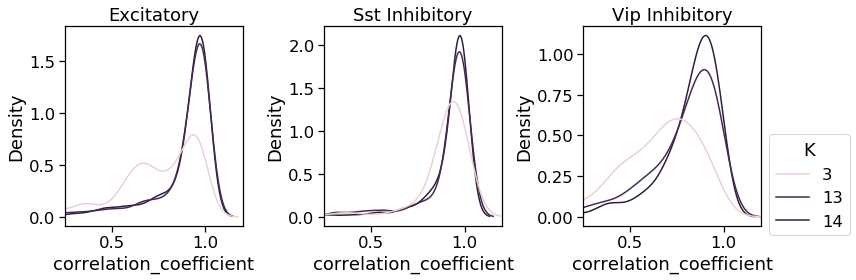

In [45]:
figsize = (12,4)
fig, ax = plt.subplots(1,3, figsize=figsize)
for i, cre_line in enumerate(cre_lines): 
    data = corr_df[corr_df.cre_line==cre_line].copy()
    ax[i] = sns.kdeplot(data=data, x='correlation_coefficient', hue='K', ax=ax[i])
    ax[i].set_title(cell_types[cre_line])
    if i<2:
        ax[i].get_legend().remove()
    ax[i].set_xlim(0.25,1.2)
ax[i].legend_.set_bbox_to_anchor((1, 0.5))
fig.tight_layout()
utils.save_figure(fig, figsize, base_dir, folder, 'correlation_distributions')

### tradeoff of mean corr coeff with cluster size 

In [46]:
n_cells = corr_df.groupby(['cre_line', 'K', 'cluster_id']).count()[['index']].rename(columns={'index':'n_cells'})
mean_corr = corr_df.groupby(['cre_line', 'K', 'cluster_id']).mean()[['correlation_coefficient']]
cluster_stats = n_cells.merge(mean_corr, on=['cre_line', 'K', 'cluster_id'])
cluster_stats = cluster_stats.reset_index()

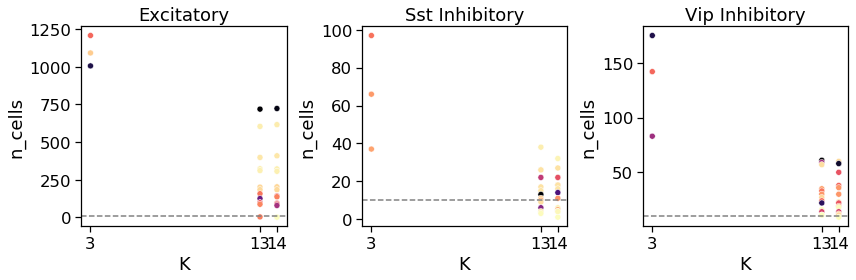

In [47]:
figsize = (12,4)
fig, ax = plt.subplots(1,3, figsize=figsize)
for i, cre_line in enumerate(cre_lines): 
    data = cluster_stats[cluster_stats.cre_line==cre_line].copy()
    ax[i] = sns.scatterplot(data=data, x='K', y='n_cells', hue='correlation_coefficient', palette='magma', ax=ax[i])
    ax[i].axhline(y=10, xmin=0, xmax=15, linestyle='--', color='gray')
    ax[i].set_title(cell_types[cre_line])
    ax[i].get_legend().remove()
    ax[i].set_xticks(K_values)
#     ax[i].set_xlim(0.25,1.2)
fig.tight_layout()
utils.save_figure(fig, figsize, base_dir, folder, 'correlation_vs_cluster_size')

### Correlations within clusters

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\marinag\Anaconda3\e

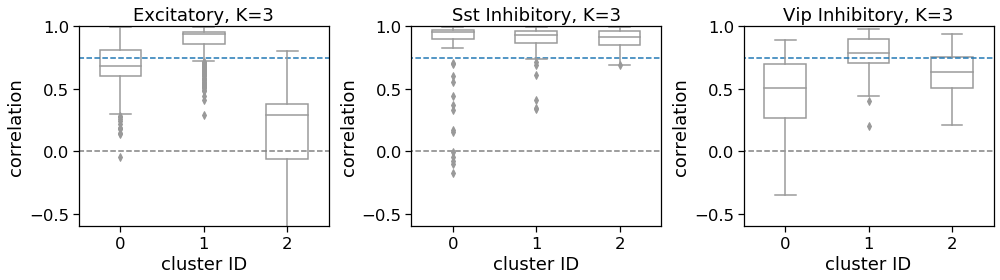

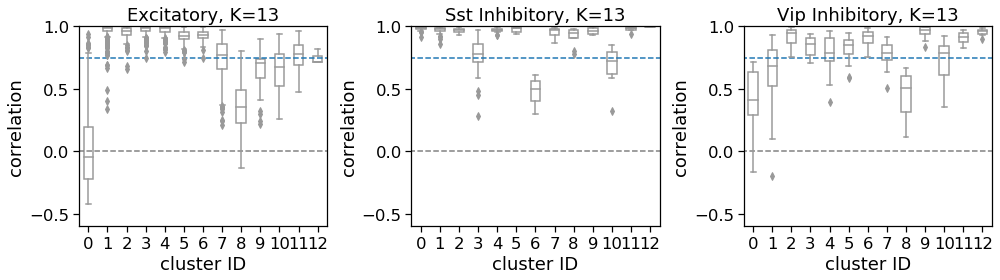

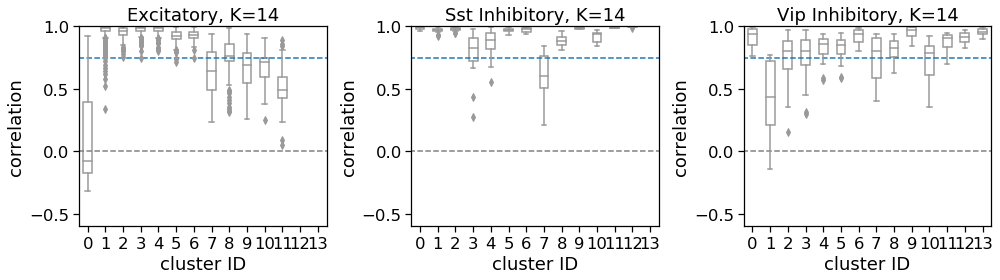

In [48]:
for K in K_values:
    figsize = (14,4)
    fig, ax = plt.subplots(1,3, figsize=figsize)
    for i,cre_line in enumerate(cre_lines):
        cre_cluster_data = corr_df[(corr_df.cre_line==cre_line)&(corr_df.K==K)]
        cell_specimen_ids = cre_cluster_data.cell_specimen_id.values
        df_dropouts = df.loc[cell_specimen_ids]
        labels_df = cre_cluster_data.set_index('cell_specimen_id').loc[cell_specimen_ids]
        cluster_corrs = vba_clust.get_cluster_density(df_dropouts, labels_df, label_col='cluster_id')
        df_labels = pd.DataFrame(columns=['corr', 'labels'])
        for key in cluster_corrs.keys():
            data = np.array([cluster_corrs[key], np.repeat(key, len(cluster_corrs[key]))])
            tmp = pd.DataFrame(data.transpose(), columns=['corr', 'labels'])
            df_labels = df_labels.append(tmp, ignore_index=True)
        df_labels['labels'] = [int(label) for label in df_labels.labels.values]
        ax[i].axhline(y=0.75, xmin=-1, xmax=max(cluster_corrs.keys())+1, color=sns.color_palette()[0], linestyle='--')
        ax[i].axhline(xmin=-1, xmax=max(cluster_corrs.keys())+1, color='grey', linestyle='--')
        ax[i] = sns.boxplot(data=df_labels, x='labels', y='corr', ax=ax[i], color='white', width=0.5)
        ax[i].set_title(cell_types[cre_line]+', K='+str(K))
        ax[i].set_ylabel('correlation')
        ax[i].set_xlabel('cluster ID')
        ax[i].set_ylim(-0.6, 1)
    fig.tight_layout()  
    utils.save_figure(fig, figsize, base_dir, folder, 'correlations_within_clusters_K_'+str(K))

### average dropouts per cre line

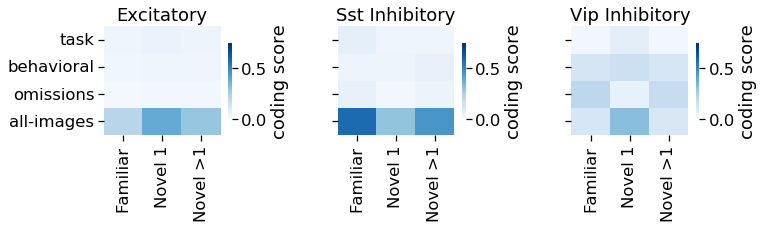

In [49]:
dropouts = rspm.merge(cells_table[['cell_specimen_id', 'cre_line', 'binned_depth', 'targeted_structure']], on='cell_specimen_id')

figsize = (11,2)
fig, ax = plt.subplots(1,3, figsize=figsize, sharex=True, sharey=True)
ax = ax.ravel()
for i, cre_line in enumerate(cre_lines):
    mean_dropouts = dropouts[dropouts.cre_line==cre_line].groupby('experience_level').mean()[features]
    ax[i] = sns.heatmap(mean_dropouts.T, cmap='Blues', vmin=0, vmax=0.75, ax=ax[i], cbar_kws={'shrink':0.7, 'label':'coding score'})
    ax[i].set_title(cell_types[cre_line])
    ax[i].set_ylim(0, 4)
    ax[i].set_xlabel('')
plt.subplots_adjust(wspace=0.6)
utils.save_figure(fig, figsize, base_dir, folder, 'average_dropouts_per_cre_line')

### clusters per cre line per K

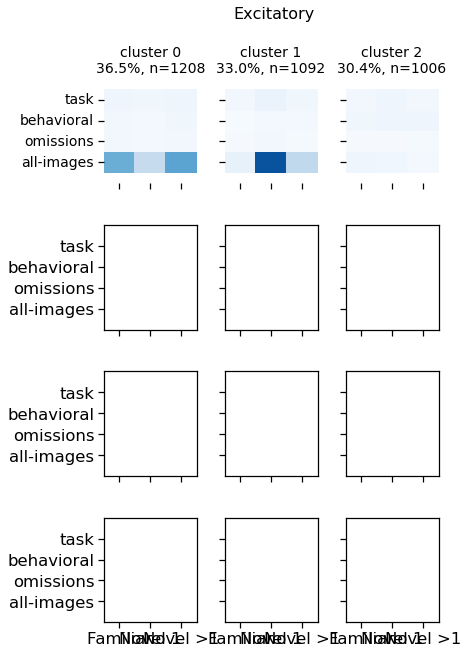

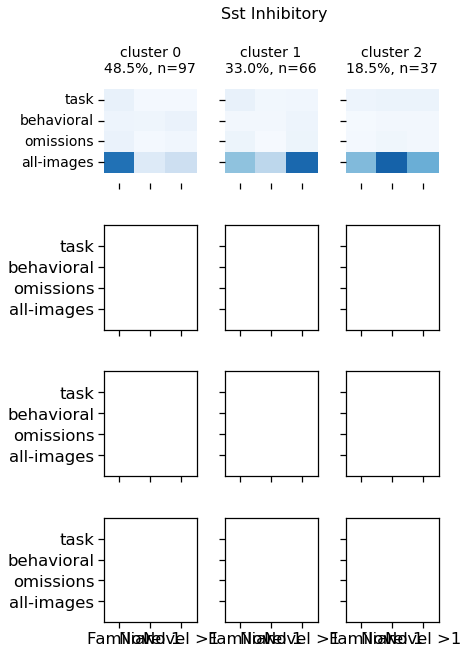

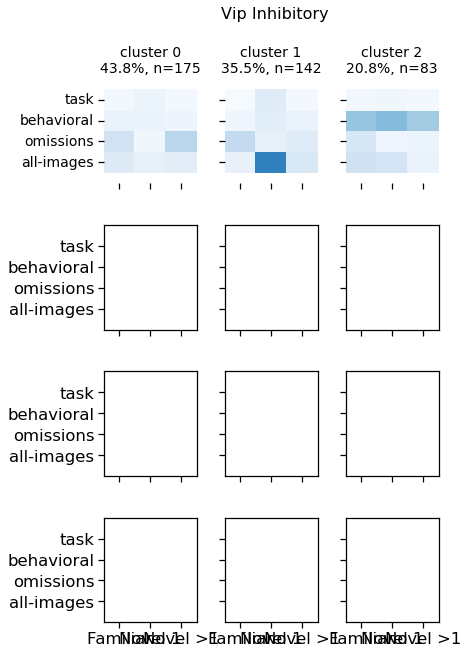

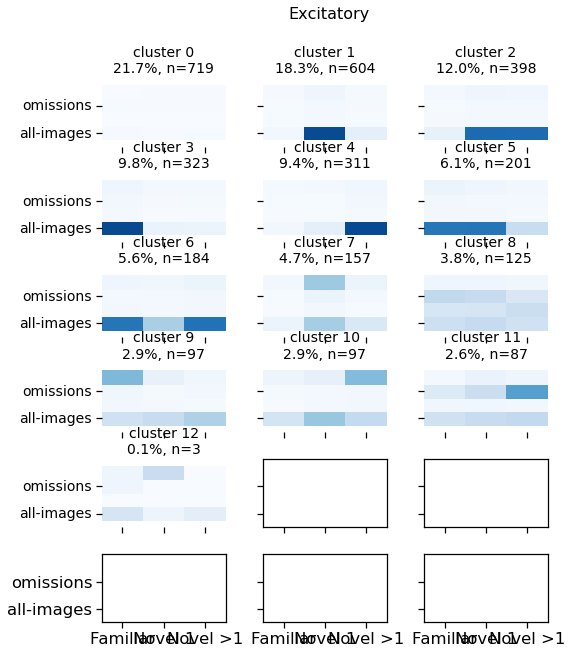

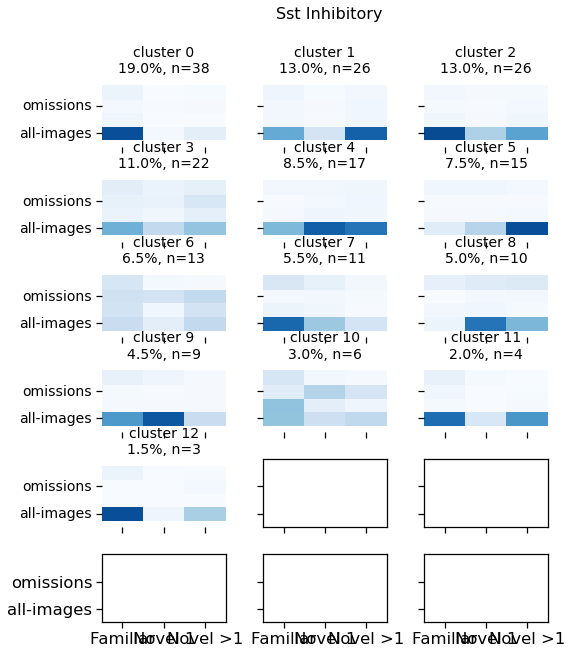

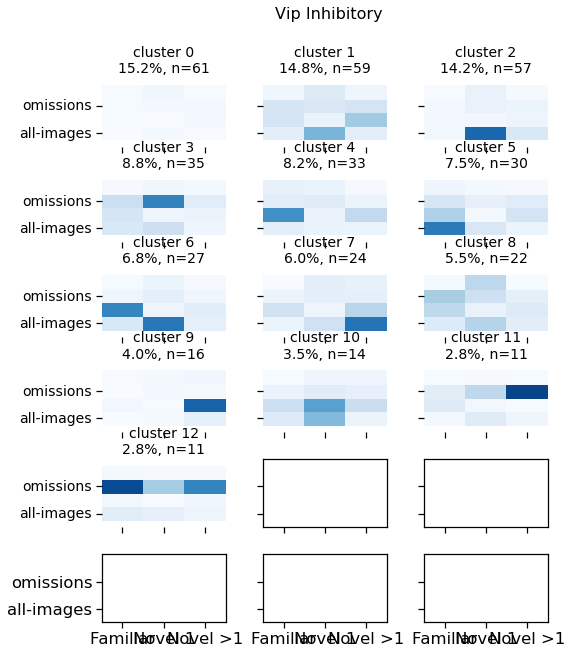

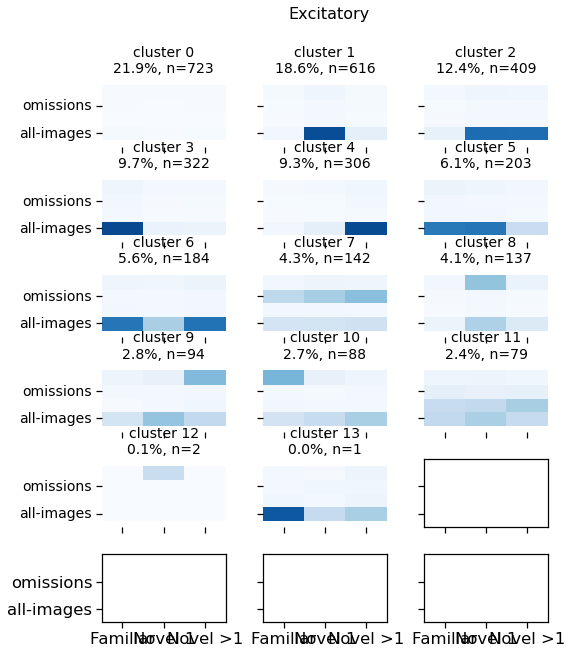

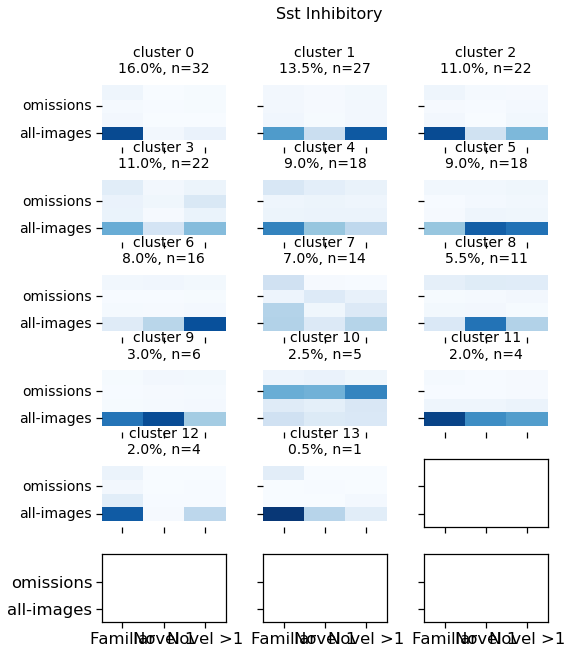

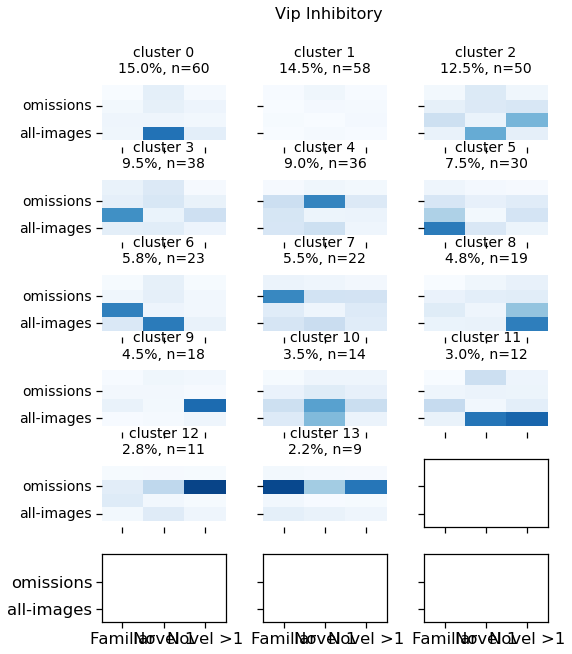

In [50]:
for K in K_values: 
    for cre_line in cre_lines:
        # get cell specimen ids for this cre line
        cre_cell_specimen_ids = df_meta[df_meta.cre_line==cre_line].index.values
        # get cluster labels dataframe for this cre line and K
        cre_cluster_ids = corr_df[(corr_df.cell_specimen_id.isin(cre_cell_specimen_ids))&(corr_df.K==K)]
        # get unique cluster labels for this cre line and K
        cluster_labels = np.sort(cre_cluster_ids.cluster_id.unique())
        n_clusters = len(cluster_labels)

        
        if K > 12:
            n_rows = 6
            figsize = (8,10)
        else: 
            n_rows = 4
            figsize = (6,10)
        fig, ax = plt.subplots(n_rows, 3, figsize=figsize, sharex=True, sharey=True)
        ax = ax.ravel()

        # limit dropouts df to cells in this cre line
        df_cre = df.loc[cre_cell_specimen_ids]
        for i, cluster_id in enumerate(cluster_labels):
            # get cell specimen ids in this cluster in this cre line
            this_cluster_csids = cre_cluster_ids[cre_cluster_ids['cluster_id'] == cluster_id].cell_specimen_id.values
            # get dropout scores for cells in this cluster in this cre line
            mean_dropout_df = np.abs(df_cre.loc[this_cluster_csids].mean().unstack())
            ax[i] = sns.heatmap(mean_dropout_df, cmap='Blues', vmin=0, vmax=1, ax=ax[i], cbar=False)
            # fraction is number of cells in this cluster vs all cells in this cre line
            fraction_cre = len(this_cluster_csids) / float(len(cre_cell_specimen_ids))
            fraction = np.round(fraction_cre * 100, 1)

            # set title and labels
            ax[i].set_title('cluster ' + str(cluster_id) + '\n' + str(fraction) + '%, n=' + str(len(this_cluster_csids)), fontsize=14)
            ax[i].set_yticklabels(mean_dropout_df.index.values, rotation=0, fontsize=14)
            ax[i].set_ylim(-0.5, 4.5)
            ax[i].set_xlabel('')
        # fig.tight_layout()
        plt.suptitle(cell_types[cre_line], x=0.52, y=.98, fontsize=16)
        plt.subplots_adjust(hspace=0.4, wspace=0.3)
        utils.save_figure(fig, figsize, base_dir, folder, 'cluster_heatmaps_'+cre_line+'_K_'+str(K))

### plot cells per cluster with corr value

In [51]:
def get_session_info(metadata):
    m = metadata.copy()
    metadata_string = 'mouse_'+str(m['mouse_id']) + '_session_' + str(m['ophys_session_id'])+'_'+m['cre_line'].split('-')[0] + '_' + m['session_type']
    return metadata_string

def get_area_depth(metadata):
    m = metadata.copy()
    metadata_string = m['targeted_structure'] + '_' + str(m['imaging_depth'])
    return metadata_string

experience_levels = np.sort(cells_table.experience_level.unique())

1006 cells in cluster 2
selecting a random subset of 100
1208 cells in cluster 0
selecting a random subset of 100
1092 cells in cluster 1
selecting a random subset of 100
97 cells in cluster 10
selecting a random subset of 97
184 cells in cluster 6
selecting a random subset of 100
398 cells in cluster 2
selecting a random subset of 100
604 cells in cluster 1
selecting a random subset of 100
157 cells in cluster 7
selecting a random subset of 100
97 cells in cluster 9
selecting a random subset of 97
719 cells in cluster 0
selecting a random subset of 100
323 cells in cluster 3
selecting a random subset of 100
311 cells in cluster 4
selecting a random subset of 100
201 cells in cluster 5
selecting a random subset of 100
87 cells in cluster 11
selecting a random subset of 87
125 cells in cluster 8
selecting a random subset of 100
3 cells in cluster 12
selecting a random subset of 3
94 cells in cluster 9
selecting a random subset of 94
184 cells in cluster 6
selecting a random subset of 10

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



88 cells in cluster 10
selecting a random subset of 88


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



723 cells in cluster 0
selecting a random subset of 100


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



137 cells in cluster 8
selecting a random subset of 100


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



322 cells in cluster 3
selecting a random subset of 100


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



306 cells in cluster 4
selecting a random subset of 100


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



203 cells in cluster 5
selecting a random subset of 100


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



79 cells in cluster 11
selecting a random subset of 79


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



2 cells in cluster 12
selecting a random subset of 2


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



1 cells in cluster 13
selecting a random subset of 1


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



37 cells in cluster 2
selecting a random subset of 37


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



66 cells in cluster 1
selecting a random subset of 66


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



97 cells in cluster 0
selecting a random subset of 97


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



17 cells in cluster 4
selecting a random subset of 17


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



26 cells in cluster 1
selecting a random subset of 26


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



4 cells in cluster 11
selecting a random subset of 4


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



15 cells in cluster 5
selecting a random subset of 15


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



38 cells in cluster 0
selecting a random subset of 38


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



26 cells in cluster 2
selecting a random subset of 26


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



3 cells in cluster 12
selecting a random subset of 3


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



22 cells in cluster 3
selecting a random subset of 22


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



13 cells in cluster 6
selecting a random subset of 13


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



10 cells in cluster 8
selecting a random subset of 10


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



6 cells in cluster 10
selecting a random subset of 6


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



9 cells in cluster 9
selecting a random subset of 9


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



11 cells in cluster 7
selecting a random subset of 11


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



18 cells in cluster 5
selecting a random subset of 18


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



27 cells in cluster 1
selecting a random subset of 27


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



22 cells in cluster 3
selecting a random subset of 22


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



22 cells in cluster 2
selecting a random subset of 22


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



16 cells in cluster 6
selecting a random subset of 16


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



32 cells in cluster 0
selecting a random subset of 32


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



18 cells in cluster 4
selecting a random subset of 18


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



5 cells in cluster 10
selecting a random subset of 5


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



14 cells in cluster 7
selecting a random subset of 14


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



4 cells in cluster 11
selecting a random subset of 4


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



4 cells in cluster 12
selecting a random subset of 4


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



6 cells in cluster 9
selecting a random subset of 6


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



11 cells in cluster 8
selecting a random subset of 11


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



1 cells in cluster 13
selecting a random subset of 1


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



175 cells in cluster 0
selecting a random subset of 100


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



142 cells in cluster 1
selecting a random subset of 100


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



83 cells in cluster 2
selecting a random subset of 83


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



22 cells in cluster 8
selecting a random subset of 22


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



61 cells in cluster 0
selecting a random subset of 61


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



33 cells in cluster 4
selecting a random subset of 33


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



57 cells in cluster 2
selecting a random subset of 57


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



59 cells in cluster 1
selecting a random subset of 59


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



14 cells in cluster 10
selecting a random subset of 14


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



30 cells in cluster 5
selecting a random subset of 30


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



24 cells in cluster 7
selecting a random subset of 24


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



27 cells in cluster 6
selecting a random subset of 27


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



16 cells in cluster 9
selecting a random subset of 16


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



35 cells in cluster 3
selecting a random subset of 35


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



11 cells in cluster 12
selecting a random subset of 11


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



11 cells in cluster 11
selecting a random subset of 11


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



50 cells in cluster 2
selecting a random subset of 50


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



18 cells in cluster 9
selecting a random subset of 18


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



38 cells in cluster 3
selecting a random subset of 38


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



58 cells in cluster 1
selecting a random subset of 58


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



23 cells in cluster 6
selecting a random subset of 23


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



60 cells in cluster 0
selecting a random subset of 60


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



14 cells in cluster 10
selecting a random subset of 14


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



30 cells in cluster 5
selecting a random subset of 30


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



12 cells in cluster 11
selecting a random subset of 12


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



22 cells in cluster 7
selecting a random subset of 22


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



19 cells in cluster 8
selecting a random subset of 19


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



36 cells in cluster 4
selecting a random subset of 36


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



9 cells in cluster 13
selecting a random subset of 9


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



11 cells in cluster 12
selecting a random subset of 11


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



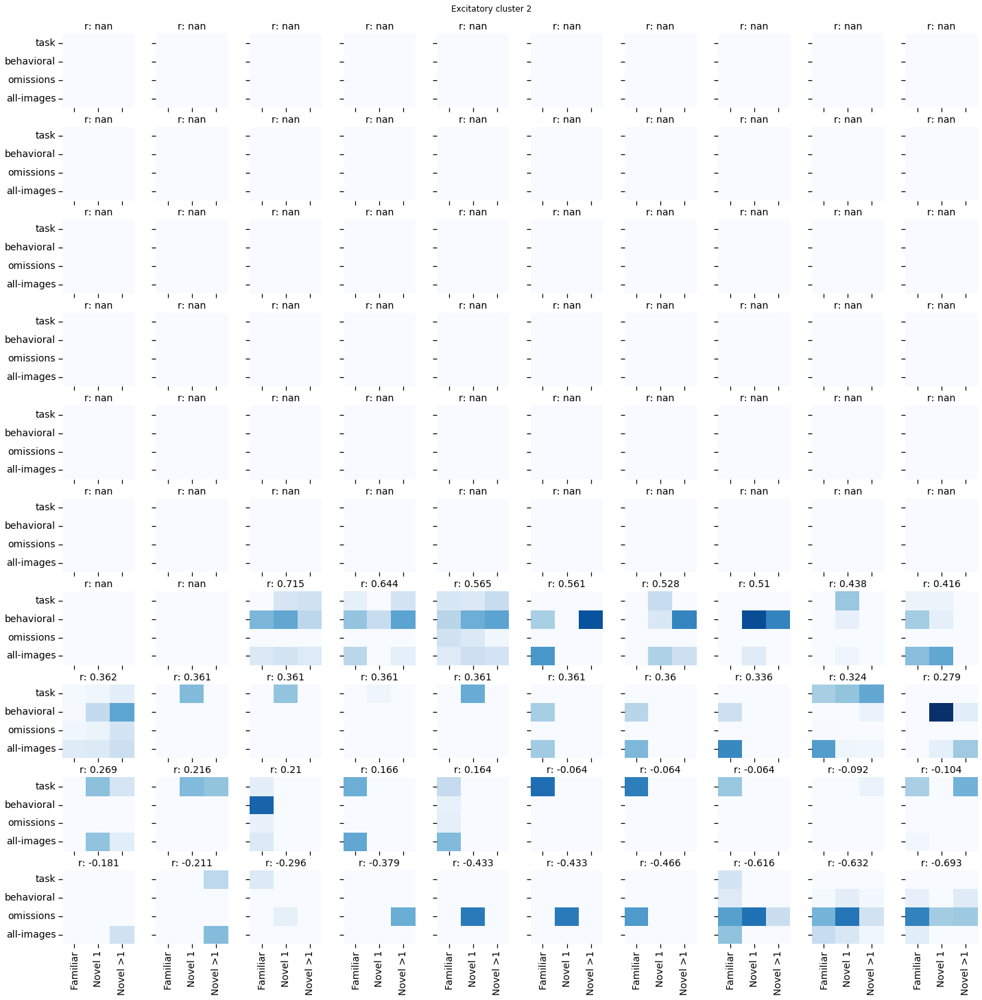

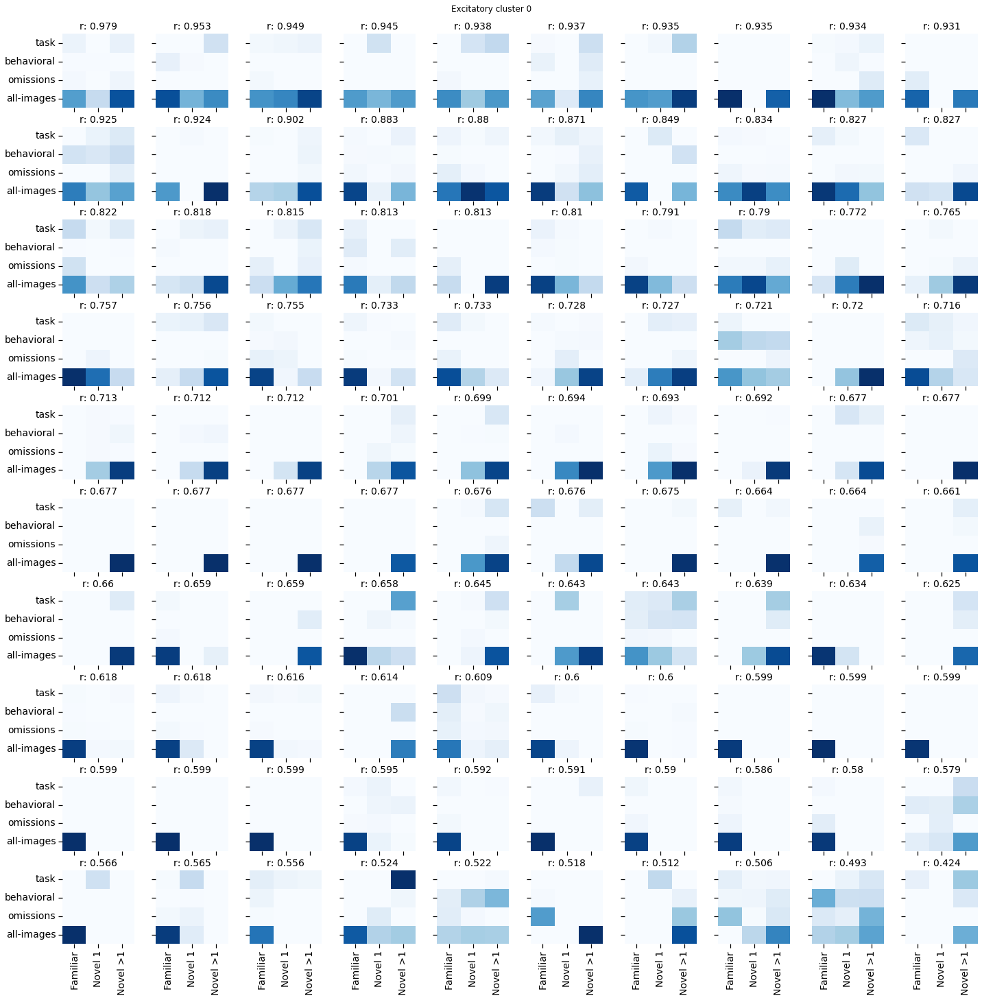

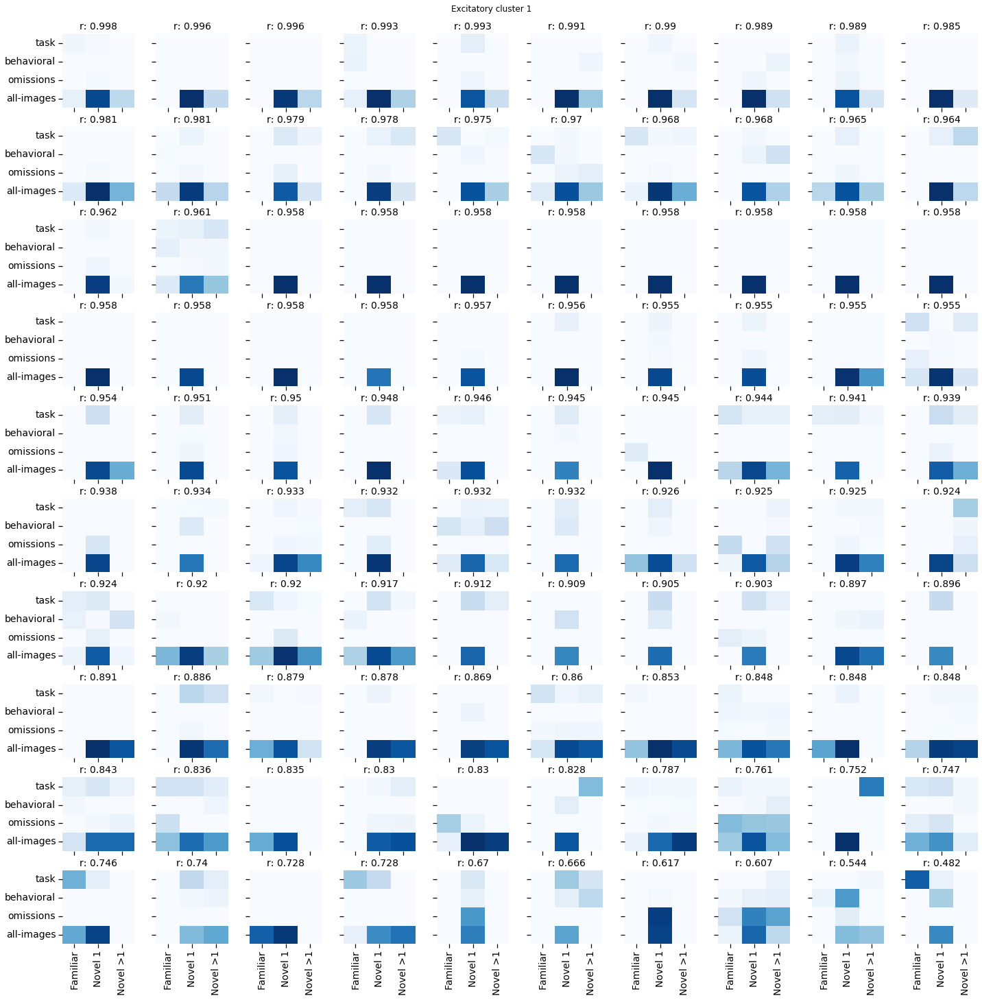

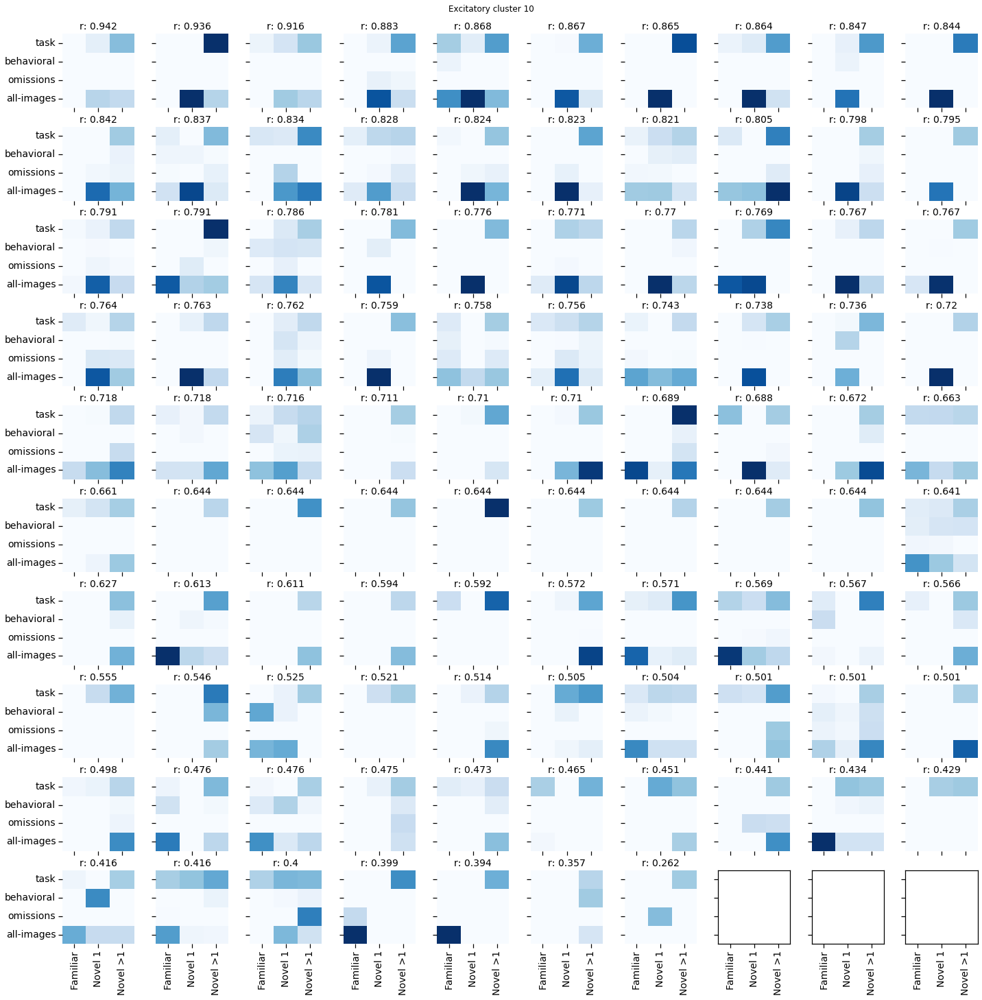

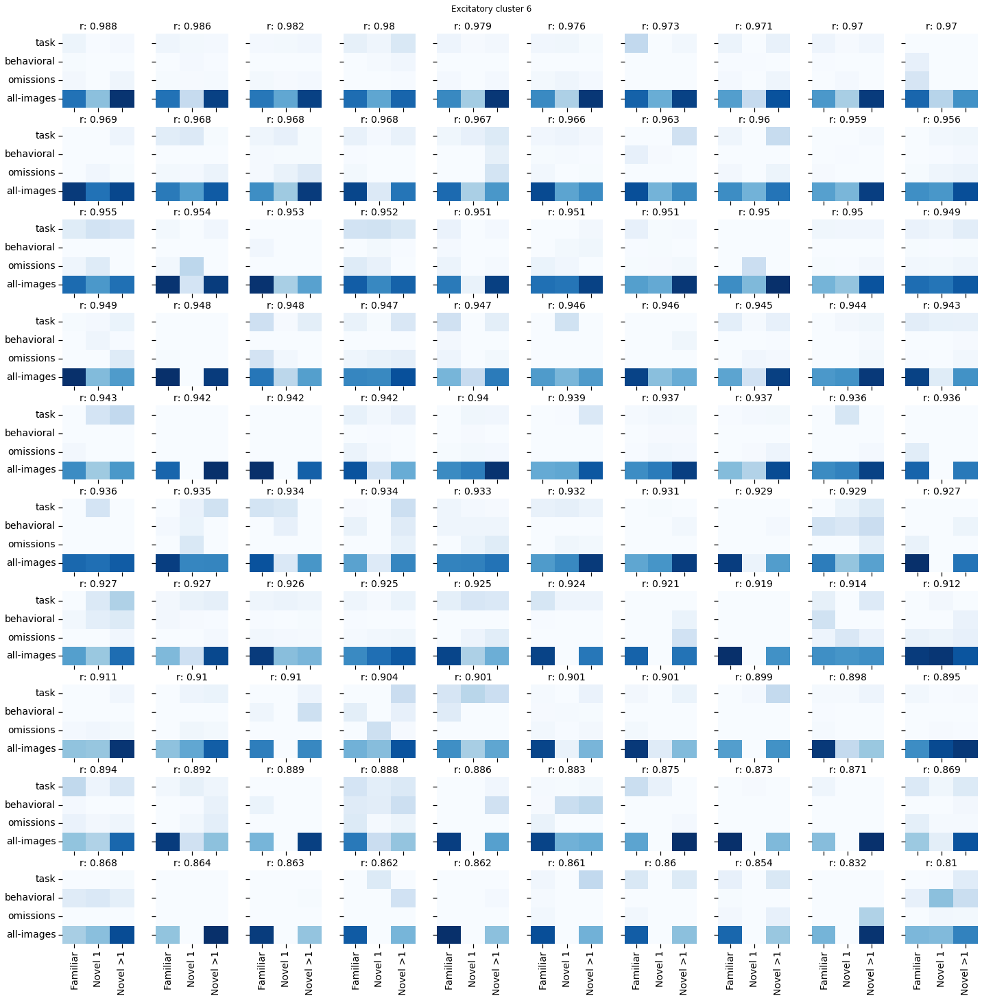

...

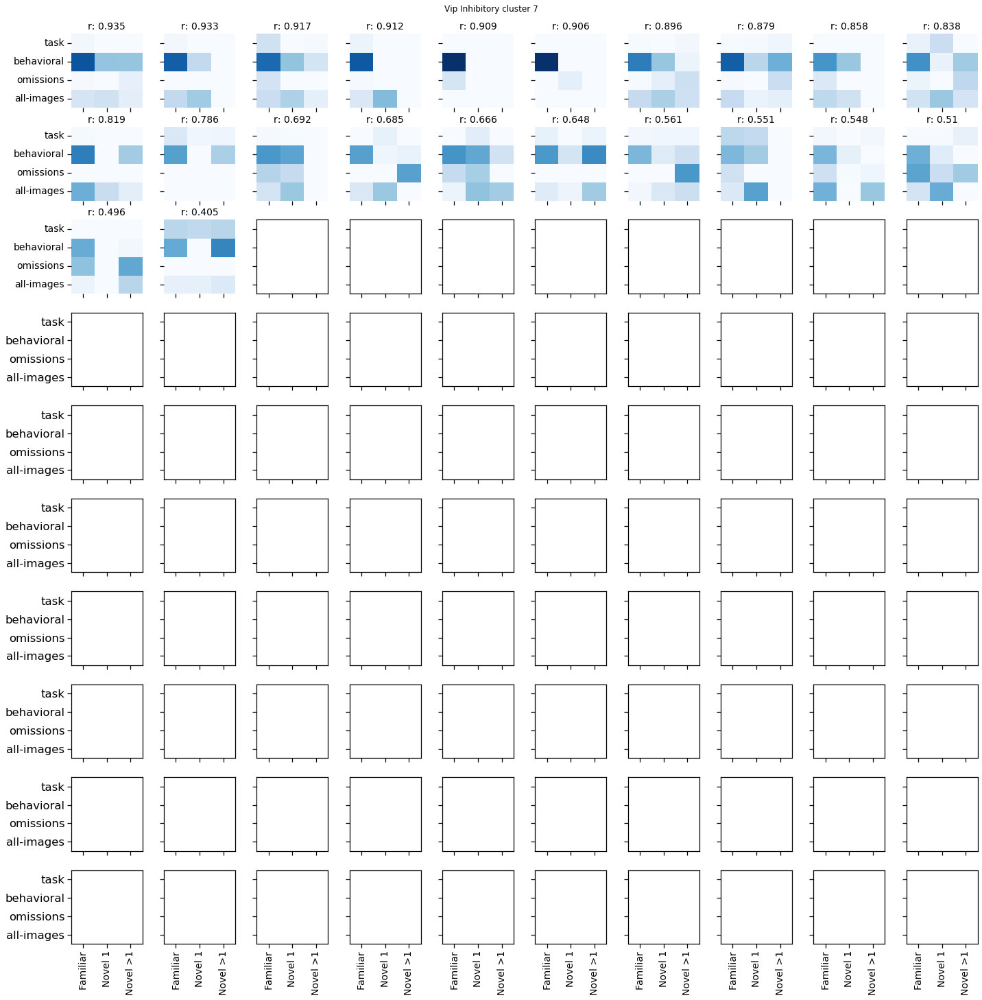

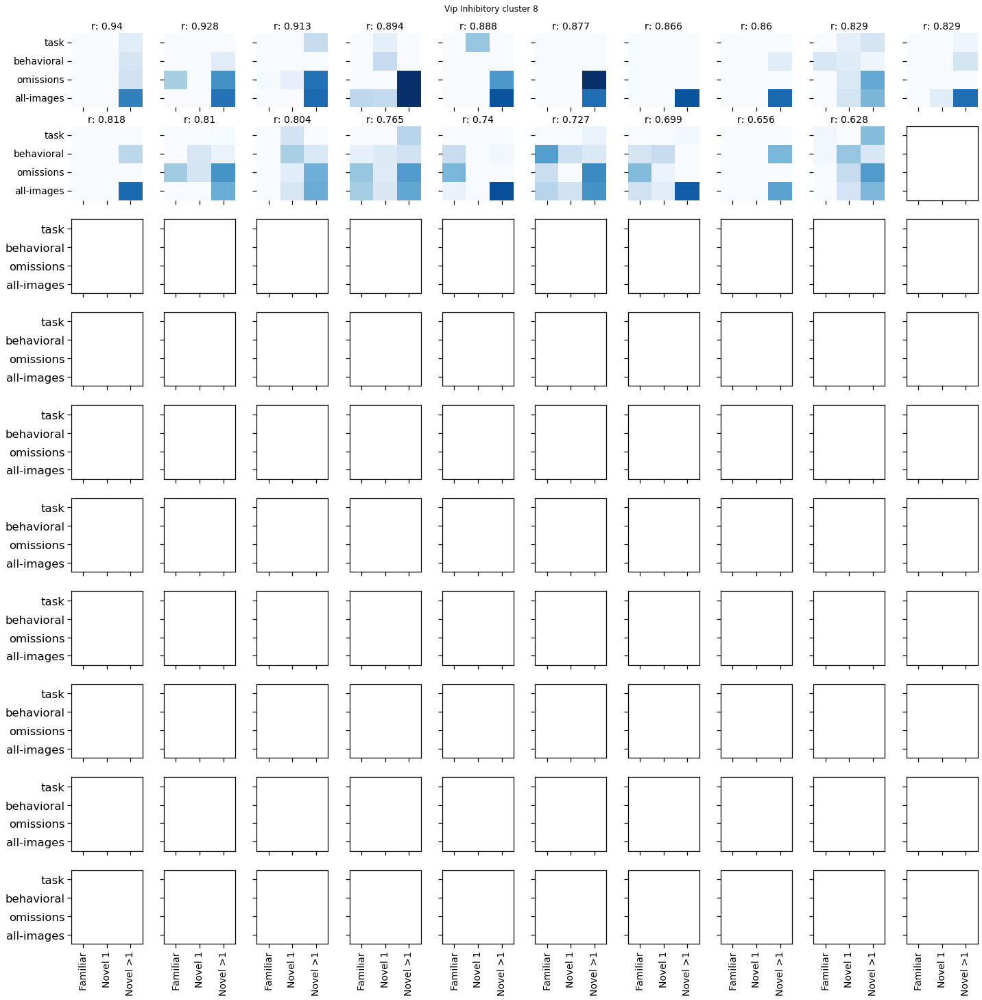

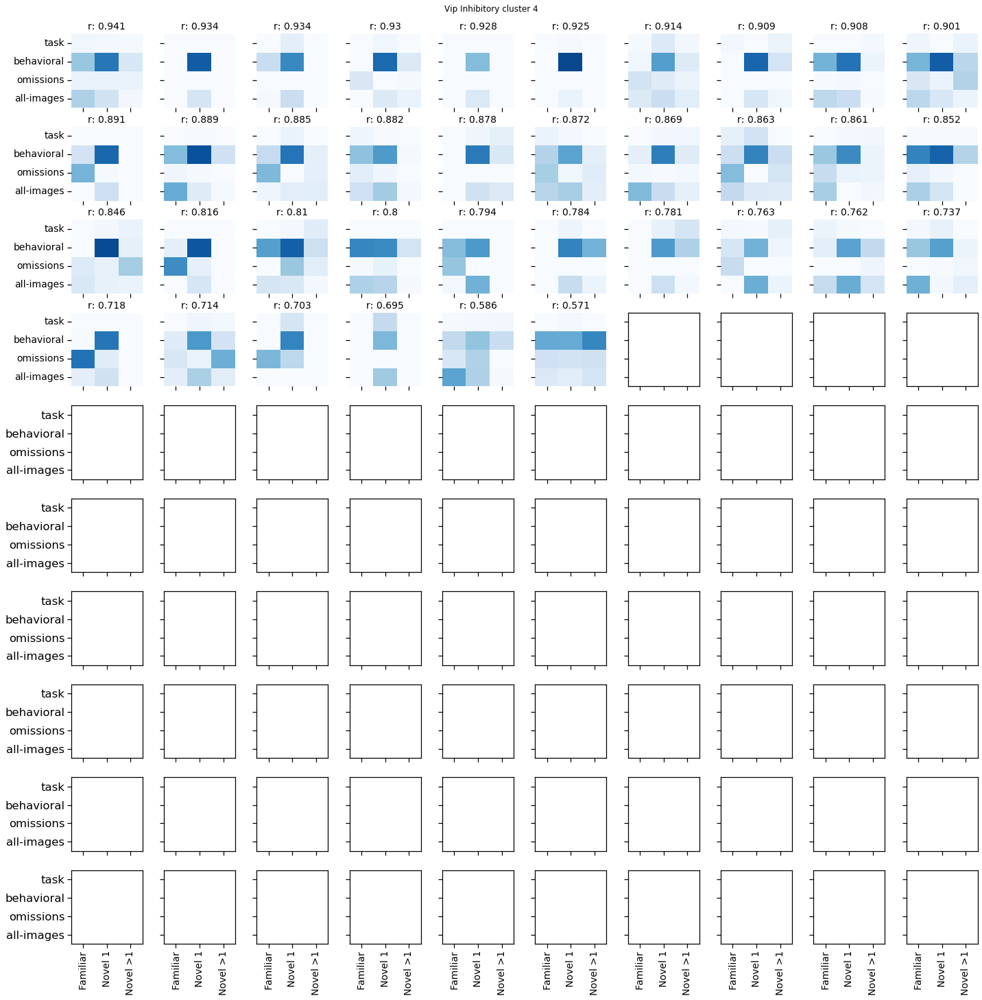

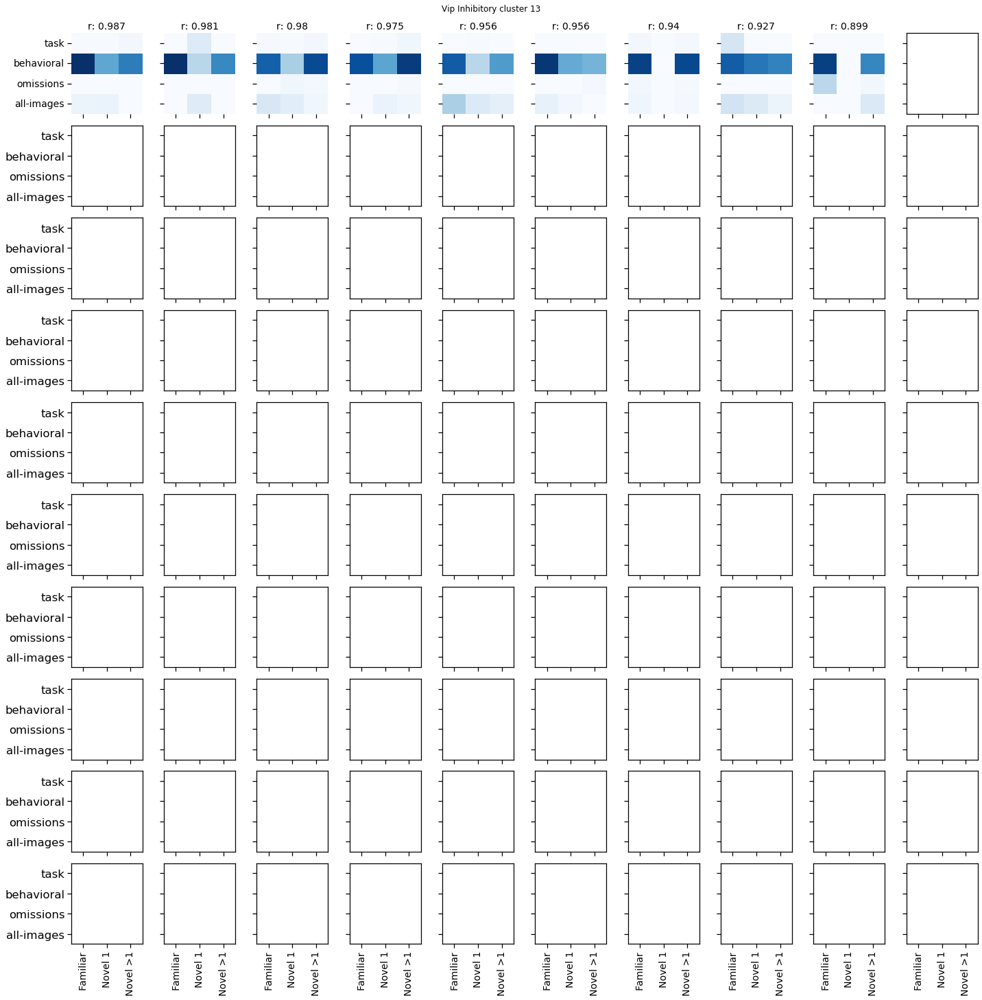

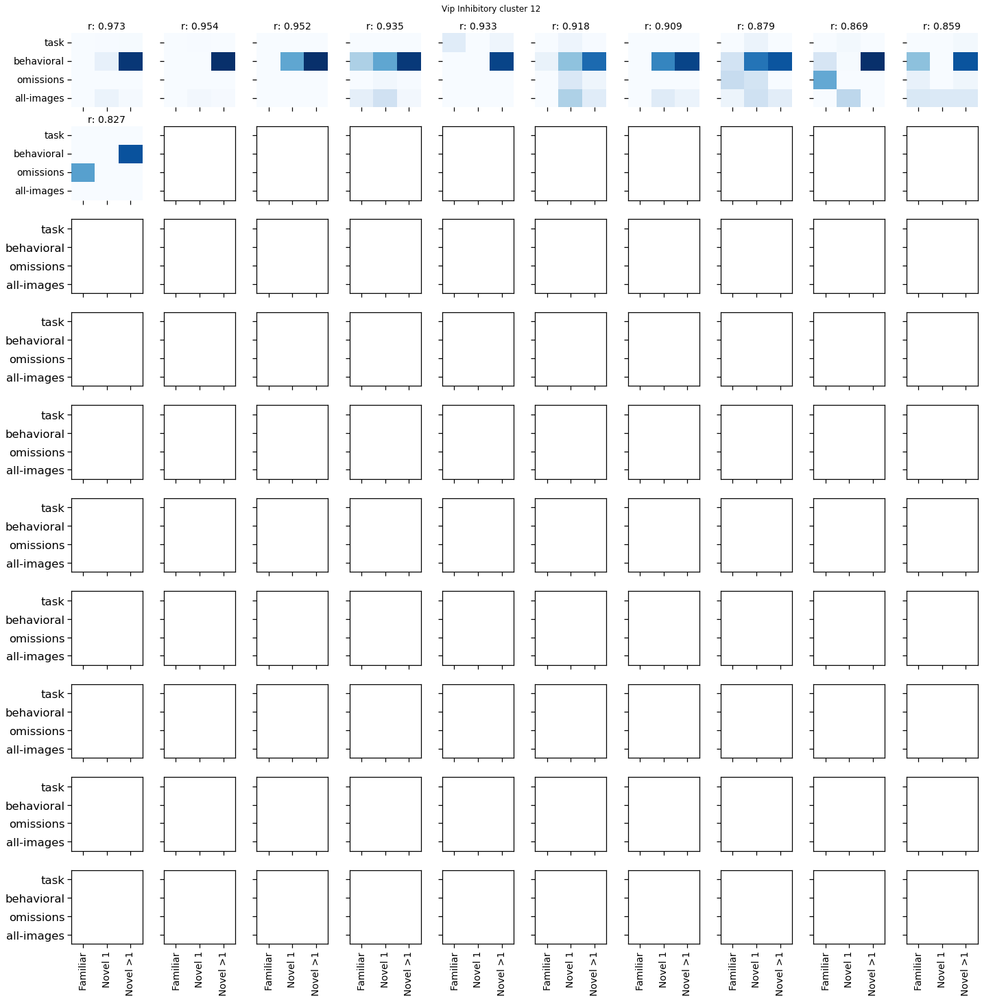

In [52]:
for cre_line in cre_lines:
    for K in K_values:
        cluster_data = corr_df[(corr_df.cre_line==cre_line)&(corr_df.K==K)]
        # cluster_data = cluster_data.sort_values(by=['targeted_structure', 'binned_depth'])
        cluster_labels = cluster_data.cluster_id.unique()

        for cluster_id in cluster_labels:

            cluster_csids = cluster_data[cluster_data.cluster_id==cluster_id].cell_specimen_id.values
            print(len(cluster_csids), 'cells in cluster', cluster_id)
            if len(cluster_csids)<100: 
                n_cells = len(cluster_csids)
            else: 
                n_cells = 100

            import random 
            print('selecting a random subset of', n_cells)
            cluster_csids = random.sample(list(cluster_csids), n_cells)

            tmp = cluster_data.copy()
            tmp = tmp.set_index('cell_specimen_id')
            order = np.argsort(tmp.loc[cluster_csids].correlation_coefficient.values)
            cluster_csids = np.asarray(cluster_csids)[order][::-1]

            figsize = (20,20)
            fig, ax = plt.subplots(10,10, figsize=figsize, sharex=True, sharey=True)
            ax = ax.ravel()
            for i, cell_specimen_id in enumerate(cluster_csids[:n_cells]):

                cell_data = cluster_data[(cluster_data.cluster_id==cluster_id)&
                                    (cluster_data.cell_specimen_id==cell_specimen_id)]
                cell_info = get_area_depth(cells_table[cells_table.cell_specimen_id==cell_specimen_id].iloc[0])
                mean_dropouts = dropouts[dropouts.cell_specimen_id==cell_specimen_id].groupby('experience_level').mean()[features]
                ax[i] = sns.heatmap(mean_dropouts.T, cmap='Blues', vmin=0, vmax=1, ax=ax[i], cbar=False)#cbar_kws={'shrink':0.7, 'label':model_output_type})
                corr_coeff = cluster_data[cluster_data.cell_specimen_id==cell_specimen_id].correlation_coefficient.values[0]
                corr_coeff = np.round(corr_coeff, 3)
                title = 'r: '+str(corr_coeff)
                ax[i].set_title(title, fontsize=14)
                ax[i].set_ylim(0,4)
                ax[i].set_yticks(np.arange(0.5, len(features)+0.5))
                ax[i].set_yticklabels(features, fontsize=14)
                ax[i].set_xlabel('')
            for i in range(90,100):
                ax[i].set_xticklabels(experience_levels, rotation=90, fontsize=14)
            fig.tight_layout()
            fig.subplots_adjust(wspace=0.3)
            fig.suptitle(cell_types[cre_line]+' cluster '+str(cluster_id), x=0.5, y=1.01)
            filename = cre_line+'_cluster_'+str(cluster_id)+'_K_'+str(K)
            utils.save_figure(fig, figsize, save_dir, 'dropout_heatmaps_per_cluster', filename)